In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
#copying the data form other folder to colab folder
%cp -av "/content/drive/MyDrive/data"  "/content/drive/MyDrive/Colab Notebooks"

'/content/drive/MyDrive/data' -> '/content/drive/MyDrive/Colab Notebooks/data'


In [61]:
import numpy as np
from tensorflow.keras.models import Model,Sequential,save_model
from tensorflow.keras.layers import Dense,Activation,Flatten,Conv2D,Lambda,Input
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.resnet50 import preprocess_input 
from tensorflow.keras.preprocessing import image 
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
from glob import glob
import warnings
warnings.filterwarnings("ignore")

In [8]:
#Let us see some image
from IPython.display import Image

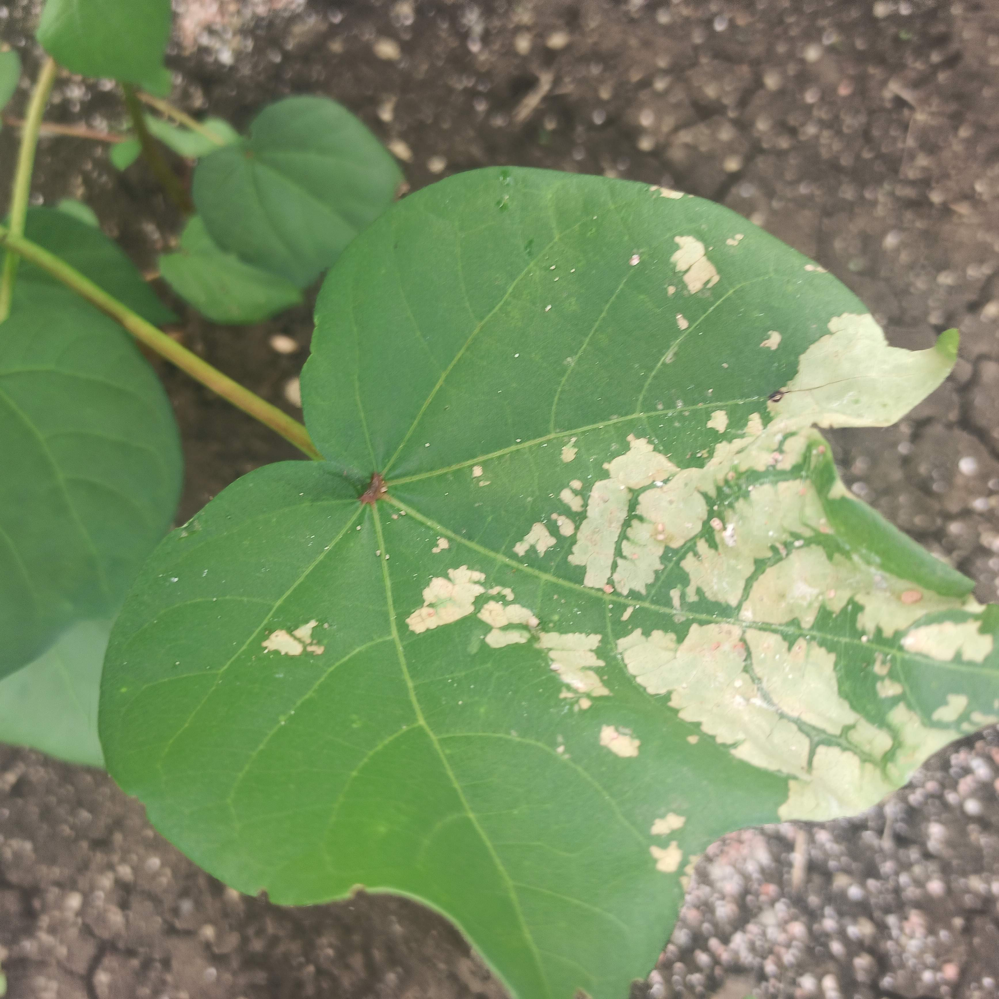

In [9]:
#diseased_cotton_leaves ---Class[1]
Image("/content/drive/MyDrive/Colab Notebooks/data/test/diseased cotton leaf/dis_leaf (124).jpg",width=300,height=300)

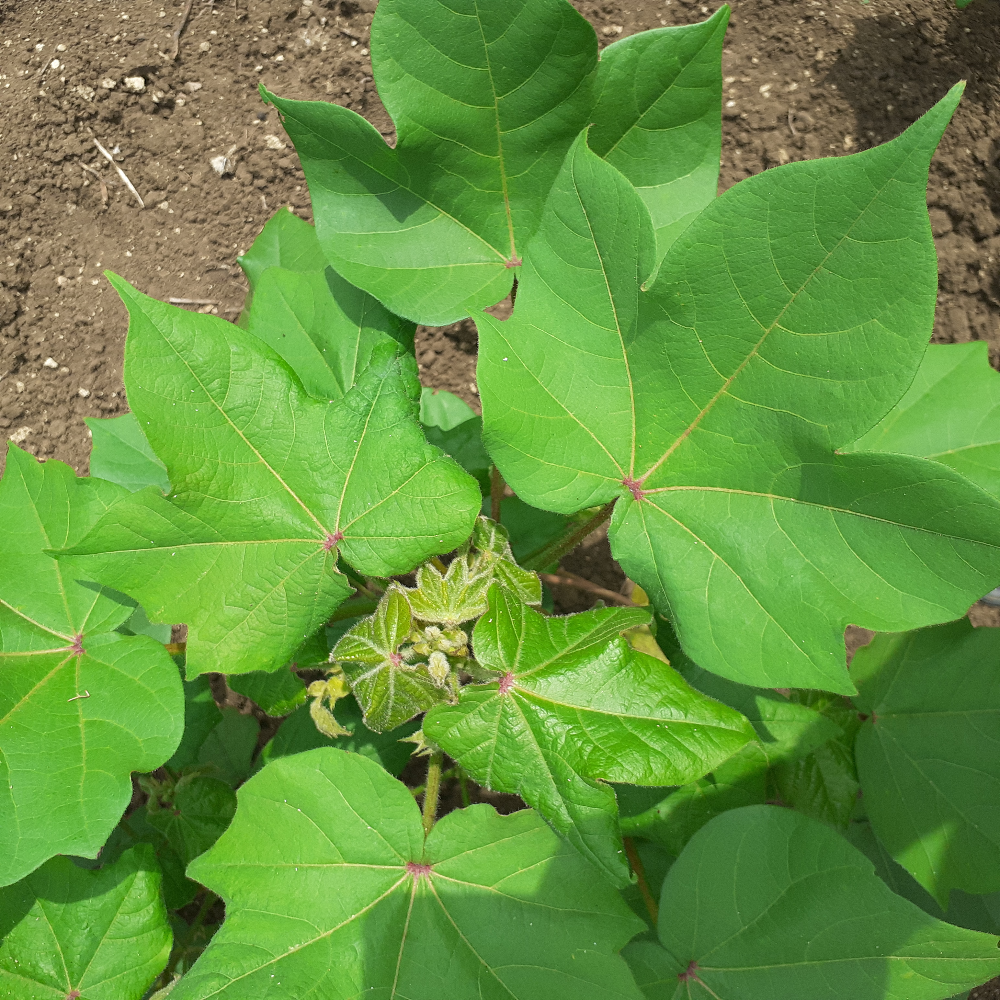

In [10]:
#
Image("/content/drive/MyDrive/Colab Notebooks/data/test/diseased cotton plant/dd (367).jpg",width=300,height=300)

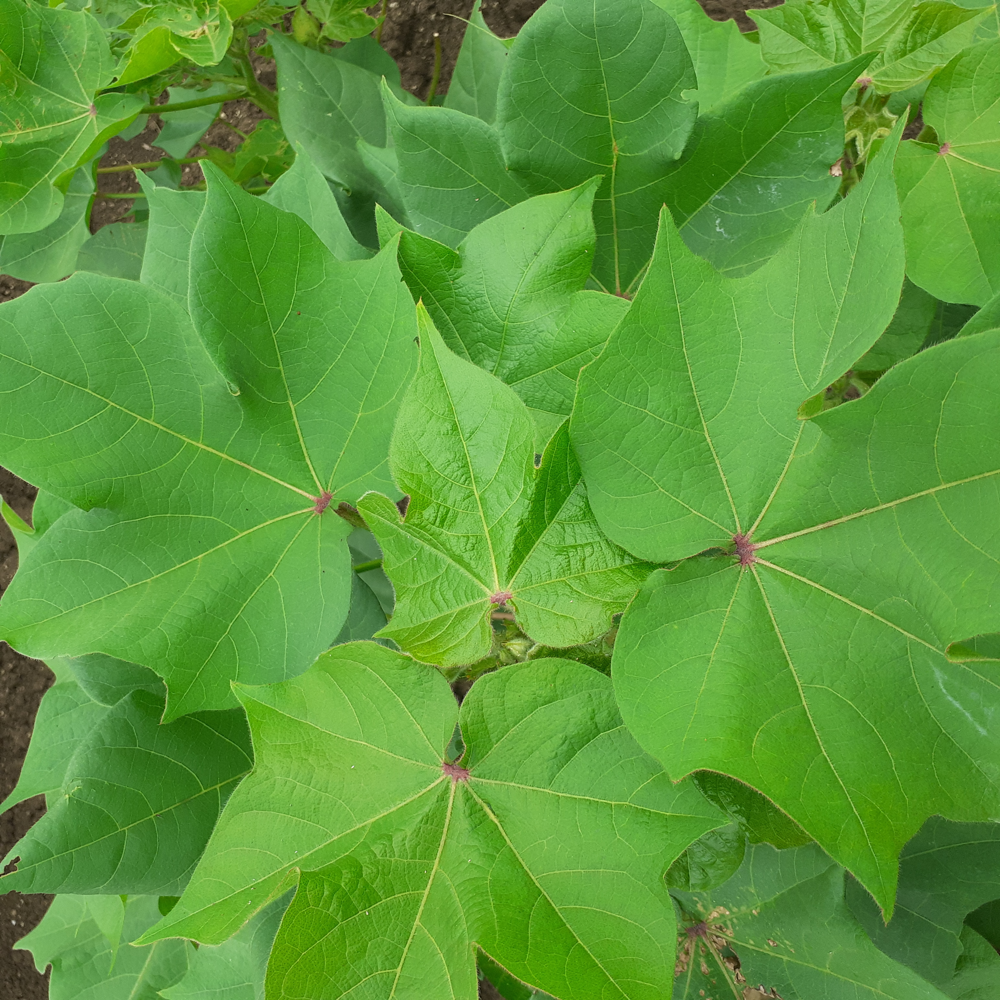

In [11]:
#fresh cotton leaves
Image("/content/drive/MyDrive/Colab Notebooks/data/test/fresh cotton plant/dsd (223).jpg",width=300,height=300)

In [43]:
#resize_image
IMAGE_SIZE =[224,224]
#path for traning_testing_validation
train_path="/content/drive/MyDrive/Colab Notebooks/data/train"
test_path ="/content/drive/MyDrive/Colab Notebooks/data/train"
valid_path="/content/drive/MyDrive/Colab Notebooks/data/val"

In [33]:
#loading_model and removing the first and last layers
mobilenet =InceptionV3(include_top=False,input_shape=IMAGE_SIZE +[3],weights='imagenet')

In [34]:
#we are not going to train the weights for this model
for layer in mobilenet.layers:
  layer.trainable =False

In [35]:
fold =glob("/content/drive/MyDrive/Colab Notebooks/data/train/*")
fold

['/content/drive/MyDrive/Colab Notebooks/data/train/diseased cotton leaf',
 '/content/drive/MyDrive/Colab Notebooks/data/train/fresh cotton leaf',
 '/content/drive/MyDrive/Colab Notebooks/data/train/diseased cotton plant',
 '/content/drive/MyDrive/Colab Notebooks/data/train/fresh cotton plant']

In [36]:
len(fold)

4

In [37]:
#adding_output_layer
X =Flatten()(mobilenet.output)
out_layers =Dense(4,activation='softmax')(X)

In [39]:
model =Model(inputs=mobilenet.input,outputs=out_layers)
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_94 (Conv2D)              (None, 111, 111, 32) 864         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_94 (BatchNo (None, 111, 111, 32) 96          conv2d_94[0][0]                  
__________________________________________________________________________________________________
activation_94 (Activation)      (None, 111, 111, 32) 0           batch_normalization_94[0][0]     
______________________________________________________________________________________________

In [40]:
#compile
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [41]:
#data_agumentaion
traning_data_gen =ImageDataGenerator(zoom_range=0.3,
                                     height_shift_range=0.2,
                                     rescale=1./255,
                                     shear_range=0.0,
                                      horizontal_flip=True,
                                      vertical_flip=True)

In [42]:
#test_data_gen
test_data_gen =ImageDataGenerator(rescale=1./255)

In [44]:
traning_data = traning_data_gen.flow_from_directory("/content/drive/MyDrive/Colab Notebooks/data/train",
                                                    target_size=(224,224),
                                                    batch_size=32,
                                                    shuffle=True,
                                                    class_mode='categorical')

Found 1951 images belonging to 4 classes.


In [48]:
valid_data =test_data_gen.flow_from_directory('/content/drive/MyDrive/Colab Notebooks/data/val',
                                                target_size=(224,224),
                                                batch_size=32,
                                                class_mode='categorical',
                                                shuffle=True)

Found 324 images belonging to 4 classes.


In [49]:
history =model.fit_generator(traning_data,
                             validation_data=valid_data,
                             epochs=25,
                             validation_steps=len(valid_data),
                             steps_per_epoch=len(traning_data))

Epoch 1/25
61/61 [==============================] - 627s 10s/step - loss: 3.6148 - accuracy: 0.6648 - val_loss: 0.5882 - val_accuracy: 0.8858
Epoch 2/25
61/61 [==============================] - 43s 702ms/step - loss: 1.0140 - accuracy: 0.8355 - val_loss: 1.1080 - val_accuracy: 0.8148
Epoch 3/25
61/61 [==============================] - 43s 703ms/step - loss: 0.8167 - accuracy: 0.8590 - val_loss: 0.6477 - val_accuracy: 0.8519
Epoch 4/25
61/61 [==============================] - 43s 710ms/step - loss: 0.7768 - accuracy: 0.8724 - val_loss: 1.1151 - val_accuracy: 0.8426
Epoch 5/25
61/61 [==============================] - 42s 681ms/step - loss: 1.3078 - accuracy: 0.8467 - val_loss: 0.4975 - val_accuracy: 0.9167
Epoch 6/25
61/61 [==============================] - 41s 679ms/step - loss: 0.9067 - accuracy: 0.8785 - val_loss: 1.4745 - val_accuracy: 0.8302
Epoch 7/25
61/61 [==============================] - 42s 682ms/step - loss: 0.7791 - accuracy: 0.8980 - val_loss: 0.5568 - val_accuracy: 0.9228


In [50]:
##model_save
from tensorflow.keras.models import load_model
model.save('model_Inversion2_cotton.h5')

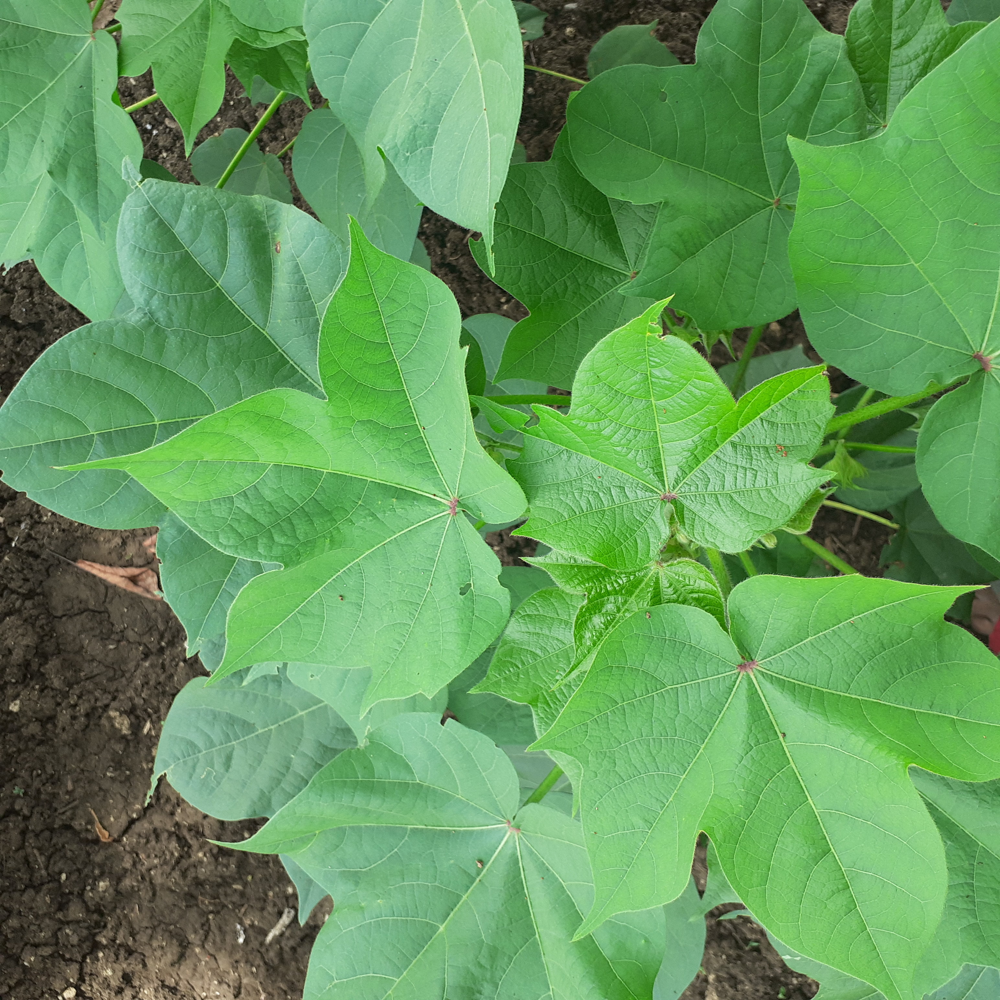

In [83]:
#lets_check_model_by testing_few_data
Image("/content/drive/MyDrive/Colab Notebooks/data/test/fresh cotton plant/dsd (228).jpg",width=300,height=300)

In [85]:
img =image.load_img("/content/drive/MyDrive/Colab Notebooks/data/test/fresh cotton plant/dsd (228).jpg",target_size=(224,224))
X=image.img_to_array(img)
X

array([[[ 90., 152., 101.],
        [ 86., 146.,  95.],
        [113., 176., 121.],
        ...,
        [ 72., 117.,  76.],
        [ 70., 115.,  72.],
        [ 72., 118.,  72.]],

       [[ 85., 148.,  95.],
        [ 93., 156., 103.],
        [ 87., 147.,  93.],
        ...,
        [ 63., 108.,  65.],
        [ 64., 109.,  66.],
        [ 63., 108.,  65.]],

       [[ 92., 155., 100.],
        [104., 167., 112.],
        [ 84., 144.,  90.],
        ...,
        [ 68., 113.,  70.],
        [ 68., 113.,  70.],
        [ 62., 107.,  64.]],

       ...,

       [[ 84.,  76.,  63.],
        [ 92.,  84.,  71.],
        [ 15.,  11.,   0.],
        ...,
        [109., 163., 127.],
        [112., 166., 132.],
        [105., 160., 129.]],

       [[ 51.,  42.,  33.],
        [ 25.,  18.,  10.],
        [ 71.,  64.,  54.],
        ...,
        [115., 169., 133.],
        [106., 160., 126.],
        [111., 166., 134.]],

       [[ 30.,  27.,  20.],
        [ 52.,  45.,  35.],
        [ 69.,  

In [86]:
X=X/255
X=np.expand_dims(X,axis=0)
img_data=preprocess_input(X)
img_data.shape

(1, 224, 224, 3)

In [87]:
model.predict(img_data)

array([[0., 0., 1., 0.]], dtype=float32)

In [88]:
a=np.argmax(model.predict(img_data), axis=1)
a

array([2])